# Textual inversion com Keras

Notebook baseado em:



*   https://keras.io/examples/generative/fine_tune_via_textual_inversion/
*   https://github.com/sayakpaul/dreambooth-keras/blob/main/src/dreambooth_trainer.py



## Instalando e atualizando bibliotecas

Iremos instalar a biblioteca KerasCV, da qual usaremos a implementação do Stable Diffusion. Além disso, iremos atualizar a biblioteca do Tensorflow e protobuf, para evitar problemas de inicialização.

# Pegar a imagem # TensorFlow 2.12.0 Python 3.10 GPU
- instalar keras_cv `pip install keras_cv==0.5.1 ` (via terminar)


## Importando as bibliotecas

In [2]:
import math
import random

import keras_cv
import numpy as np
import tensorflow as tf
print(tf.__version__)
from keras_cv import layers as cv_layers
from keras_cv.models.stable_diffusion import NoiseScheduler
from tensorflow import keras
import matplotlib.pyplot as plt

2023-09-24 21:36:19.520964: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-24 21:36:19.575231: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX512F AVX512_VNNI, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2.12.0


## Funções úteis

*   __plot_image__: Função que imprime a imagem no notebook;
*   __pad_embedding__: Função que preenche a quantidade de tokens até o valor de contexto máximo (77, no caso).

In [3]:
def plot_images(images):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.axis("off")

def pad_embedding(embedding):
    return embedding + (
        [stable_diffusion.tokenizer.end_of_text] * (MAX_PROMPT_LENGTH - len(embedding))
    )

## Funções de criação do dataset

*   __assemble_image_dataset__: Função que recebe uma lista de arquivos, realiza *data augmentation* e cria um TF Dataset;
*   __assemble_text_dataset__: Função que recebe uma lista de prompts e o novo token do objeto/estilo a ser aprendido, e tokeniza os inputs;
*   __assemble_dataset__: Cria pares de imagem e prompt, para serem usados no treinamento.

In [4]:
def assemble_image_dataset(file_paths, size):
    # Resize images
    resize = keras.layers.Resizing(height=size, width=size, crop_to_aspect_ratio=True)
    images = [keras.utils.load_img(img) for img in file_paths]
    images = [keras.utils.img_to_array(img) for img in images]
    images = np.array([resize(img) for img in images])

    # The StableDiffusion image encoder requires images to be normalized to the
    # [-1, 1] pixel value range
    images = images / 127.5 - 1

    # Create the tf.data.Dataset
    image_dataset = tf.data.Dataset.from_tensor_slices(images)

    # Shuffle and introduce random noise
    image_dataset = image_dataset.shuffle(50, reshuffle_each_iteration=True)
    image_dataset = image_dataset.map(
        cv_layers.RandomCropAndResize(
            target_size=(512, 512),
            crop_area_factor=(0.8, 1.0),
            aspect_ratio_factor=(1.0, 1.0),
        ),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    image_dataset = image_dataset.map(
        cv_layers.RandomFlip(mode="horizontal"),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    return image_dataset


def assemble_text_dataset(prompts, placeholder_token):
    prompts = [prompt.format(placeholder_token) for prompt in prompts]
    embeddings = [stable_diffusion.tokenizer.encode(prompt) for prompt in prompts]
    embeddings = [np.array(pad_embedding(embedding)) for embedding in embeddings]
    text_dataset = tf.data.Dataset.from_tensor_slices(embeddings)
    return text_dataset


def assemble_dataset(file_paths, placeholder_token, prompts, size):
    image_dataset = assemble_image_dataset(file_paths, size)
    text_dataset = assemble_text_dataset(prompts, placeholder_token)

    image_dataset = image_dataset.repeat()
    text_dataset = text_dataset.repeat(5)
    return tf.data.Dataset.zip((image_dataset, text_dataset))

## Classe para treinar Textual Inversion

Definição da classe **TextualInversionFineTuner**, a qual é uma subclasse do *keras.Model* que sobrescreve o método *train_step* para treinar o embedding do novo token adicionado no *text encoder*.

Antes do treinamento, recriamos o *text encoder* com o novo token adicionado e inicializamos ele com base no "subject" enviado pelo usuário. O "subject" pode ser entendido como uma classe principal ao qual o objeto pertence.

De forma simplista, o processo de treinamento se dá da seguinte forma:

1.   Pegamos uma das imagens de treinamento, passamos em um *image encoder* para obter o embedding dessa imagem;
2.   Adicionamos ruído nesse embedding, com base em um timestep aleatório;
3.   Chamamos o modelo de difusão para prever o ruído usando como entrada o embedding ruidoso do passo acima;
4.   Calculamos a loss entre o ruído adicionado e o ruído predito.



In [5]:
class TextualInversionFineTuner(keras.Model):
    def __init__(self, stable_diffusion, noise_scheduler, placeholder_token, subject="sks", **kwargs):
        super().__init__(**kwargs)
        self.stable_diffusion = stable_diffusion
        self.noise_scheduler = noise_scheduler

        self._add_new_token(placeholder_token, subject)

        self.training_image_encoder = keras.Model(
            stable_diffusion.image_encoder.input,
            stable_diffusion.image_encoder.layers[-2].output,
        )

    def _traverse_layers(self, layer):
      if hasattr(layer, "layers"):
          for layer in layer.layers:
              yield layer
      if hasattr(layer, "token_embedding"):
          yield layer.token_embedding
      if hasattr(layer, "position_embedding"):
          yield layer.position_embedding


    def _add_new_token(self, placeholder_token, subject):
        tokenized_initializer = self.stable_diffusion.tokenizer.encode(subject)[1]  # Inicializando com um token raro
        new_weights = self.stable_diffusion.text_encoder.layers[2].token_embedding(
            tf.constant(tokenized_initializer)
        )

        # Novo tamanho do vocabulario
        new_vocab_size = len(self.stable_diffusion.tokenizer.vocab)

        # A camada de embedding é a layer de indice 2
        old_token_weights = self.stable_diffusion.text_encoder.layers[
            2
        ].token_embedding.get_weights()
        old_position_weights = self.stable_diffusion.text_encoder.layers[
            2
        ].position_embedding.get_weights()

        old_token_weights = old_token_weights[0]
        new_weights = np.expand_dims(new_weights, axis=0)
        new_weights = np.concatenate([old_token_weights, new_weights], axis=0)

        # Have to set download_weights False so we can init (otherwise tries to load weights)
        new_encoder = keras_cv.models.stable_diffusion.TextEncoder(
            keras_cv.models.stable_diffusion.stable_diffusion.MAX_PROMPT_LENGTH,
            vocab_size=new_vocab_size,
            download_weights=False,
        )
        for index, layer in enumerate(self.stable_diffusion.text_encoder.layers):
            # Layer 2 is the embedding layer, so we omit it from our weight-copying
            if index == 2:
                continue
            new_encoder.layers[index].set_weights(layer.get_weights())


        new_encoder.layers[2].token_embedding.set_weights([new_weights])
        new_encoder.layers[2].position_embedding.set_weights(old_position_weights)

        self.stable_diffusion._text_encoder = new_encoder
        self.stable_diffusion._text_encoder.compile(jit_compile=True)

        self.stable_diffusion.diffusion_model.trainable = False
        self.stable_diffusion.decoder.trainable = False
        self.stable_diffusion.text_encoder.trainable = True

        self.stable_diffusion.text_encoder.layers[2].trainable = True

        for layer in self._traverse_layers(self.stable_diffusion.text_encoder):
          if isinstance(layer, keras.layers.Embedding) or "clip_embedding" in layer.name:
              layer.trainable = True
          else:
              layer.trainable = False

        new_encoder.layers[2].position_embedding.trainable = False


    def sample_from_encoder_outputs(self, outputs):
        mean, logvar = tf.split(outputs, 2, axis=-1)
        logvar = tf.clip_by_value(logvar, -30.0, 20.0)
        std = tf.exp(0.5 * logvar)
        sample = tf.random.normal(tf.shape(mean))
        return mean + std * sample


    def get_timestep_embedding(self, timestep, dim=320, max_period=10000):
        half = dim // 2
        freqs = tf.math.exp(
            -math.log(max_period) * tf.range(0, half, dtype=tf.float32) / half
        )
        args = tf.convert_to_tensor([timestep], dtype=tf.float32) * freqs
        embedding = tf.concat([tf.math.cos(args), tf.math.sin(args)], 0)
        return embedding


    def get_position_ids(self):
        return tf.convert_to_tensor([list(range(MAX_PROMPT_LENGTH))], dtype=tf.int32)


    def train_step(self, data):
        images, embeddings = data

        with tf.GradientTape() as tape:
            # Sample from the predicted distribution for the training image
            latents = self.sample_from_encoder_outputs(self.training_image_encoder(images))
            # The latents must be downsampled to match the scale of the latents used
            # in the training of StableDiffusion.  This number is truly just a "magic"
            # constant that they chose when training the model.
            latents = latents * 0.18215

            # Produce random noise in the same shape as the latent sample
            noise = tf.random.normal(tf.shape(latents))
            batch_dim = tf.shape(latents)[0]

            # Pick a random timestep for each sample in the batch
            timesteps = tf.random.uniform(
                (batch_dim,),
                minval=0,
                maxval=noise_scheduler.train_timesteps,
                dtype=tf.int64,
            )

            # Add noise to the latents based on the timestep for each sample
            noisy_latents = self.noise_scheduler.add_noise(latents, noise, timesteps)

            # Encode the text in the training samples to use as hidden state in the
            # diffusion model
            encoder_hidden_state = self.stable_diffusion.text_encoder(
                [embeddings, self.get_position_ids()]
            )

            # Compute timestep embeddings for the randomly-selected timesteps for each
            # sample in the batch
            timestep_embeddings = tf.map_fn(
                fn=self.get_timestep_embedding,
                elems=timesteps,
                fn_output_signature=tf.float32,
            )

            # Call the diffusion model
            noise_pred = self.stable_diffusion.diffusion_model(
                [noisy_latents, timestep_embeddings, encoder_hidden_state]
            )

            # Compute the mean-squared error loss and reduce it.
            loss = self.compiled_loss(noise_pred, noise)
            loss = tf.reduce_mean(loss, axis=2)
            loss = tf.reduce_mean(loss, axis=1)
            loss = tf.reduce_mean(loss)

        # Load the trainable weights and compute the gradients for them
        trainable_weights = self.stable_diffusion.text_encoder.trainable_weights
        grads = tape.gradient(loss, trainable_weights)

        index_of_placeholder_token = tf.reshape(tf.where(grads[0].indices == 49408), ())
        condition = grads[0].indices == 49408
        condition = tf.expand_dims(condition, axis=-1)

        # Override the gradients, zeroing out the gradients for all slices that
        # aren't for the placeholder token, effectively freezing the weights for
        # all other tokens.
        grads[0] = tf.IndexedSlices(
            values=tf.where(condition, grads[0].values, 0),
            indices=grads[0].indices,
            dense_shape=grads[0].dense_shape,
        )

        self.optimizer.apply_gradients(zip(grads, trainable_weights))
        return {"loss": loss}

## Treinamento



### Parâmetros de treino

In [6]:
MAX_PROMPT_LENGTH = 77
EPOCHS = 50
placeholder_token = "evandropires"
subject = "person"

### Inicializando modelo base e testando resultado sem treino

Como o novo token será inicializado com o embedding do subject, testamos a geração de imagem com o subject para vermos a diferença no final do treino.

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
1356917/1356917 [==============================] - 0s 0us/step


2023-09-24 21:36:59.851325: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-24 21:37:00.068465: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-09-24 21:37:00.068713: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

492466864/492466864 [==============================] - 7s 0us/step


2023-09-24 21:37:18.710982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 21:37:22.467886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]


3439090152/3439090152 [==============================] - 43s 0us/step


2023-09-24 21:38:52.776264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:01.087797: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8800
2023-09-24 21:39:09.382590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 1/50 [..............................] - ETA: 1:28:55

2023-09-24 21:39:11.411447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:11.912640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 48s    

2023-09-24 21:39:12.425074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:12.926455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 47s

2023-09-24 21:39:13.438318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:13.941080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 46s

2023-09-24 21:39:14.455293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:14.956283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 45s

2023-09-24 21:39:15.468633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:15.970646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 44s

2023-09-24 21:39:16.483098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:16.986179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 43s

2023-09-24 21:39:17.500120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:18.005793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 42s

2023-09-24 21:39:18.522393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:19.027380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 41s

2023-09-24 21:39:19.542017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:20.046561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 40s

2023-09-24 21:39:20.561863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:21.068597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 39s

2023-09-24 21:39:21.587048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:22.092039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 38s

2023-09-24 21:39:22.607935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:23.113632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 37s

2023-09-24 21:39:23.630682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:24.138732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 36s

2023-09-24 21:39:24.654455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:25.159066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 35s

2023-09-24 21:39:25.673742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:26.181112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 34s

2023-09-24 21:39:26.696033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:27.204757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 33s

2023-09-24 21:39:27.722848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:28.230024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 32s

2023-09-24 21:39:28.748888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:29.260049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 31s

2023-09-24 21:39:29.776856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:30.284675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 30s

2023-09-24 21:39:30.803344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:31.311288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 29s

2023-09-24 21:39:31.825931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:32.337768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 28s

2023-09-24 21:39:32.855895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:33.365432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 27s

2023-09-24 21:39:33.883514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:34.392240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 26s

2023-09-24 21:39:34.907800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:35.417919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 25s

2023-09-24 21:39:35.937208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:36.448089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 24s

2023-09-24 21:39:36.966859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:37.476703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 23s

2023-09-24 21:39:37.994685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:38.505577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 22s

2023-09-24 21:39:39.028596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:39.539893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 21s

2023-09-24 21:39:40.060031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:40.571187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 20s

2023-09-24 21:39:41.091088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:41.601388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 19s

2023-09-24 21:39:42.120371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:42.632737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 18s

2023-09-24 21:39:43.149147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:43.661645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 17s

2023-09-24 21:39:44.182644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:44.696012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 16s

2023-09-24 21:39:45.217207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:45.732318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 15s

2023-09-24 21:39:46.252602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:46.761957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 14s

2023-09-24 21:39:47.285422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:47.797122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 13s

2023-09-24 21:39:48.322655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:48.834719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 12s

2023-09-24 21:39:49.357857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:49.869902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 11s

2023-09-24 21:39:50.392463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:50.905205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 10s

2023-09-24 21:39:51.427622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:51.938890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 9s 

2023-09-24 21:39:52.460706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:52.974126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 8s

2023-09-24 21:39:53.497793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:54.010398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 7s

2023-09-24 21:39:54.531857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:55.043322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 6s

2023-09-24 21:39:55.566350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:56.077971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 5s

2023-09-24 21:39:56.600244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:57.112801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 4s

2023-09-24 21:39:57.638686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:58.153699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 3s

2023-09-24 21:39:58.678375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:39:59.193751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 2s

2023-09-24 21:39:59.716838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:40:00.230581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 1s

2023-09-24 21:40:00.755974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:40:01.270202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


198180272/198180272 [==============================] - 2s 0us/step


2023-09-24 21:40:09.887632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]


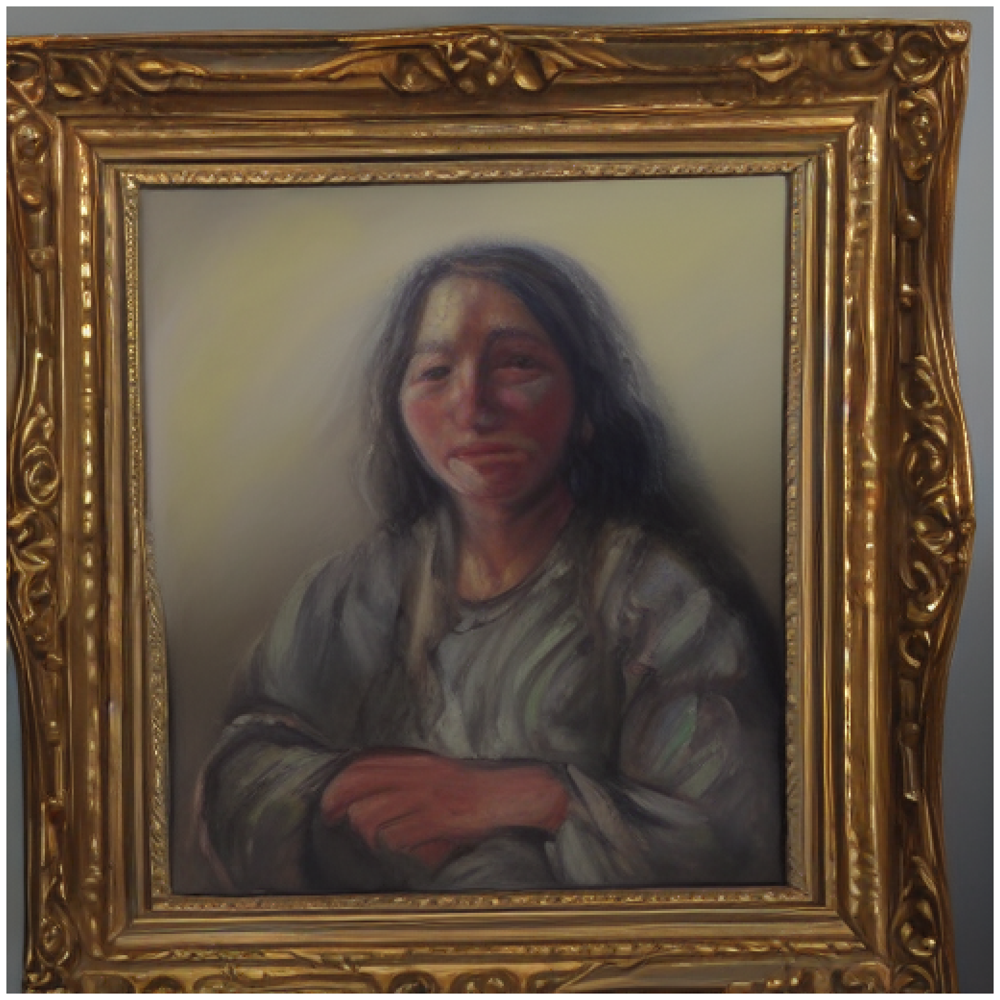

In [7]:
stable_diffusion = keras_cv.models.StableDiffusion()
stable_diffusion.tokenizer.add_tokens(placeholder_token)

generated = stable_diffusion.text_to_image(
    f"an oil painting of {subject}", seed=1337, batch_size=1
)
plot_images(generated)

### Criando o dataset

Aqui, passamos os caminhos das imagens que iremos usar, o token que estamos adicionando, e uma lista com variações de prompts a fim de aumentar nossa base de treino e ter certa variância.

In [8]:
train_ds = assemble_dataset(
    file_paths=["evandro1.jpg",
                "evandro2.jpg",
                "evandro3.jpg",
                "evandro4.jpg",
                "evandro5.png",
                "evandro6.png",
                "evandro7.png",
                "evandro8.png",
                "evandro9.png"],
    placeholder_token=placeholder_token,
    prompts=[
        "a photo of a {}",
        "a rendering of a {}",
        "a cropped photo of the {}",
        "the photo of a {}",
        "a photo of a clean {}",
        "a photo of my {}",
        "a photo of the cool {}",
        "a close-up photo of a {}",
        "a bright photo of the {}",
        "a cropped photo of a {}",
        "a photo of the {}",
        "a good photo of the {}",
        "a photo of one {}",
        "a close-up photo of the {}",
        "a rendition of the {}",
        "a photo of the clean {}",
        "a rendition of a {}",
        "a photo of a nice {}",
        "a good photo of a {}",
        "a photo of the nice {}",
        "a photo of the small {}",
        "a photo of the weird {}",
        "a photo of the large {}",
        "a photo of a cool {}",
        "a photo of a small {}",
    ],
    size=512
)

train_ds = train_ds.batch(1).shuffle(
    train_ds.cardinality(), reshuffle_each_iteration=True
)

### Definindo otimizador e noise_scheduler

In [9]:
noise_scheduler = NoiseScheduler(
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    train_timesteps=1000,
)

learning_rate = keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=1e-4, decay_steps=train_ds.cardinality() * EPOCHS
)

optimizer = keras.optimizers.Adam(
    weight_decay=0.004, learning_rate=learning_rate, epsilon=1e-8, global_clipnorm=10
)

### Instanciando classe de treinamento

In [10]:
trainer = TextualInversionFineTuner(stable_diffusion, noise_scheduler,
                                    placeholder_token, subject=subject,
                                    name="trainer")

trainer.compile(
    optimizer=optimizer,
    # We are performing reduction manually in our train step, so none is required here.
    loss=keras.losses.MeanSquaredError(reduction="none"),
)

136824240/136824240 [==============================] - 2s 0us/step


In [11]:
class GenerateImages(keras.callbacks.Callback):
    def __init__(
        self, stable_diffusion, prompt, steps=25, frequency=20, seed=None, **kwargs
    ):
        super().__init__(**kwargs)
        self.stable_diffusion = stable_diffusion
        self.prompt = prompt
        self.seed = seed
        self.frequency = frequency
        self.steps = steps

    def on_epoch_end(self, epoch, logs):
        if epoch % self.frequency == 0:
            images = self.stable_diffusion.text_to_image(
                self.prompt, batch_size=1, num_steps=self.steps, seed=self.seed
            )
            plot_images(
                images,
            )


cbs = [
    GenerateImages(
        stable_diffusion, prompt=f"an oil painting of {placeholder_token}", seed=1337
    ),
    GenerateImages(
        stable_diffusion, prompt=f"a {placeholder_token} stamp", seed=1337
    )
]

Bora treinar!!!

Epoch 1/50


2023-09-24 21:40:33.934369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_9' with dtype resource
	 [[{{node Placeholder/_9}}]]
2023-09-24 21:40:33.934872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_9' with dtype resource
	 [[{{node Placeholder/_9}}]]
2023-09-24 21:41:53.871567: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 6.68GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-09-24 21:41:53.871635: W tensorflo

  1/125 [..............................] - ETA: 2:48:40 - loss: 0.0025

2023-09-24 21:41:55.566491: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


125/125 [==============================] - ETA: 0s - loss: 0.2110

2023-09-24 21:44:56.721214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 21:45:02.913550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 21:45:02.954217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,76

 1/25 [>.............................] - ETA: 25s

2023-09-24 21:45:04.006232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:04.509281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/25 [=>............................] - ETA: 23s

2023-09-24 21:45:05.020761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:05.523063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/25 [==>...........................] - ETA: 22s

2023-09-24 21:45:06.033712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:06.537604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/25 [===>..........................] - ETA: 21s

2023-09-24 21:45:07.050820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:07.553565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/25 [=====>........................] - ETA: 20s

2023-09-24 21:45:08.065851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:08.569518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/25 [======>.......................] - ETA: 19s

2023-09-24 21:45:09.080486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:09.585444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/25 [=======>......................] - ETA: 18s

2023-09-24 21:45:10.096148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:10.596113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/25 [========>.....................] - ETA: 17s

2023-09-24 21:45:11.109307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:11.613605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/25 [=========>....................] - ETA: 16s

2023-09-24 21:45:12.124640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:12.628948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/25 [===========>..................] - ETA: 15s

2023-09-24 21:45:13.140863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:13.644193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/25 [============>.................] - ETA: 14s

2023-09-24 21:45:14.154886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:14.656426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/25 [=============>................] - ETA: 13s

2023-09-24 21:45:15.168525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:15.669988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/25 [==============>...............] - ETA: 12s

2023-09-24 21:45:16.183486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:16.685836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/25 [===============>..............] - ETA: 11s

2023-09-24 21:45:17.197308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:17.698056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/25 [=================>............] - ETA: 10s

2023-09-24 21:45:18.211760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:18.714880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/25 [==================>...........] - ETA: 9s 

2023-09-24 21:45:19.226518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:19.729996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/25 [===================>..........] - ETA: 8s

2023-09-24 21:45:20.240275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:20.743867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/25 [====================>.........] - ETA: 7s

2023-09-24 21:45:21.253210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:21.757306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/25 [=====================>........] - ETA: 6s

2023-09-24 21:45:22.270871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:22.772952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/25 [=======================>......] - ETA: 5s

2023-09-24 21:45:23.285436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:23.792595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/25 [========================>.....] - ETA: 4s

2023-09-24 21:45:24.303319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:24.807441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/25 [=========================>....] - ETA: 3s

2023-09-24 21:45:25.318397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:25.821754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/25 [==========================>...] - ETA: 2s

2023-09-24 21:45:26.331357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:26.836931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/25 [===========================>..] - ETA: 1s

2023-09-24 21:45:27.348693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:27.851765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/25 [==============================] - 25s 1s/step


2023-09-24 21:45:28.359895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]
2023-09-24 21:45:28.954621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 21:45:28.971380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,

 1/25 [>.............................] - ETA: 24s

2023-09-24 21:45:30.024397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:30.527504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/25 [=>............................] - ETA: 23s

2023-09-24 21:45:31.038844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:31.543599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/25 [==>...........................] - ETA: 22s

2023-09-24 21:45:32.053127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:32.558097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/25 [===>..........................] - ETA: 21s

2023-09-24 21:45:33.072634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:33.578167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/25 [=====>........................] - ETA: 20s

2023-09-24 21:45:34.092829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:34.597007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/25 [======>.......................] - ETA: 19s

2023-09-24 21:45:35.108797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:35.613744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/25 [=======>......................] - ETA: 18s

2023-09-24 21:45:36.125758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:36.629422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/25 [========>.....................] - ETA: 17s

2023-09-24 21:45:37.143161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:37.646849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/25 [=========>....................] - ETA: 16s

2023-09-24 21:45:38.159176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:38.661524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/25 [===========>..................] - ETA: 15s

2023-09-24 21:45:39.174793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:39.676159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/25 [============>.................] - ETA: 14s

2023-09-24 21:45:40.188678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:40.693577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/25 [=============>................] - ETA: 13s

2023-09-24 21:45:41.206923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:41.711122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/25 [==============>...............] - ETA: 12s

2023-09-24 21:45:42.223207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:42.731249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/25 [===============>..............] - ETA: 11s

2023-09-24 21:45:43.245287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:43.752045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/25 [=================>............] - ETA: 10s

2023-09-24 21:45:44.267346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:44.772808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/25 [==================>...........] - ETA: 9s 

2023-09-24 21:45:45.284680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:45.787251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/25 [===================>..........] - ETA: 8s

2023-09-24 21:45:46.304222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:46.808347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/25 [====================>.........] - ETA: 7s

2023-09-24 21:45:47.319194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:47.824126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/25 [=====================>........] - ETA: 6s

2023-09-24 21:45:48.340430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:48.844470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/25 [=======================>......] - ETA: 5s

2023-09-24 21:45:49.359071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:49.864624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/25 [========================>.....] - ETA: 4s

2023-09-24 21:45:50.376241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:50.880576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/25 [=========================>....] - ETA: 3s

2023-09-24 21:45:51.394496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:51.901493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/25 [==========================>...] - ETA: 2s

2023-09-24 21:45:52.414516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:52.920128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/25 [===========================>..] - ETA: 1s

2023-09-24 21:45:53.437182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 21:45:53.942880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/25 [==============================] - 25s 1s/step


2023-09-24 21:45:54.453063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]


125/125 [==============================] - 321s 2s/step - loss: 0.1021
Epoch 2/50
125/125 [==============================] - 185s 1s/step - loss: 0.1076
Epoch 3/50
125/125 [==============================] - 194s 2s/step - loss: 0.1223
Epoch 4/50
125/125 [==============================] - 195s 2s/step - loss: 0.1300
Epoch 5/50
125/125 [==============================] - 193s 2s/step - loss: 0.1004
Epoch 6/50
125/125 [==============================] - 192s 2s/step - loss: 0.1293
Epoch 7/50
125/125 [==============================] - 192s 2s/step - loss: 0.1072
Epoch 8/50
125/125 [==============================] - 192s 2s/step - loss: 0.1140
Epoch 9/50
125/125 [==============================] - 189s 2s/step - loss: 0.1271
Epoch 10/50
125/125 [==============================] - 180s 1s/step - loss: 0.1249
Epoch 11/50
125/125 [==============================] - 180s 1s/step - loss: 0.1335
Epoch 12/50
125/125 [==============================] - 180s 1s/step - loss: 0.1184
Epoch 13/50
125/125 [===

2023-09-24 22:48:26.122498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 22:48:26.139699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 22:48:26.173964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,76

 1/25 [>.............................] - ETA: 26s

2023-09-24 22:48:27.261906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:27.793429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/25 [=>............................] - ETA: 24s

2023-09-24 22:48:28.342535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:28.878683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/25 [==>...........................] - ETA: 23s

2023-09-24 22:48:29.422288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:29.956883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/25 [===>..........................] - ETA: 22s

2023-09-24 22:48:30.503024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:31.034797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/25 [=====>........................] - ETA: 21s

2023-09-24 22:48:31.584370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:32.120095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/25 [======>.......................] - ETA: 20s

2023-09-24 22:48:32.667189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:33.203569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/25 [=======>......................] - ETA: 19s

2023-09-24 22:48:33.752126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:34.287817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/25 [========>.....................] - ETA: 18s

2023-09-24 22:48:34.833382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:35.369743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/25 [=========>....................] - ETA: 17s

2023-09-24 22:48:35.919020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:36.451911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/25 [===========>..................] - ETA: 16s

2023-09-24 22:48:36.999270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:37.534745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/25 [============>.................] - ETA: 15s

2023-09-24 22:48:38.079812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:38.613943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/25 [=============>................] - ETA: 14s

2023-09-24 22:48:39.162269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:39.694990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/25 [==============>...............] - ETA: 12s

2023-09-24 22:48:40.243596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:40.775398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/25 [===============>..............] - ETA: 11s

2023-09-24 22:48:41.320997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:41.856954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/25 [=================>............] - ETA: 10s

2023-09-24 22:48:42.401261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:42.935868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/25 [==================>...........] - ETA: 9s 

2023-09-24 22:48:43.480907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:44.012915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/25 [===================>..........] - ETA: 8s

2023-09-24 22:48:44.559351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:45.090200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/25 [====================>.........] - ETA: 7s

2023-09-24 22:48:45.640618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:46.175082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/25 [=====================>........] - ETA: 6s

2023-09-24 22:48:46.722373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:47.258015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/25 [=======================>......] - ETA: 5s

2023-09-24 22:48:47.802446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:48.336277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/25 [========================>.....] - ETA: 4s

2023-09-24 22:48:48.880716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:49.413572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/25 [=========================>....] - ETA: 3s

2023-09-24 22:48:49.961435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:50.493330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/25 [==========================>...] - ETA: 2s

2023-09-24 22:48:51.039161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:51.570718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/25 [===========================>..] - ETA: 1s

2023-09-24 22:48:52.118181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:52.647483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/25 [==============================] - 27s 1s/step


2023-09-24 22:48:53.193397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]
2023-09-24 22:48:53.839838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 22:48:53.856442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,

 1/25 [>.............................] - ETA: 26s

2023-09-24 22:48:54.972542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:55.505061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/25 [=>............................] - ETA: 24s

2023-09-24 22:48:56.046824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:56.580508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/25 [==>...........................] - ETA: 23s

2023-09-24 22:48:57.123557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:57.655776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/25 [===>..........................] - ETA: 22s

2023-09-24 22:48:58.198577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:58.731672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/25 [=====>........................] - ETA: 21s

2023-09-24 22:48:59.277437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:48:59.812622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/25 [======>.......................] - ETA: 20s

2023-09-24 22:49:00.354854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:00.890078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/25 [=======>......................] - ETA: 19s

2023-09-24 22:49:01.429948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:01.965390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/25 [========>.....................] - ETA: 18s

2023-09-24 22:49:02.505733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:03.042408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/25 [=========>....................] - ETA: 17s

2023-09-24 22:49:03.581217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:04.116439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/25 [===========>..................] - ETA: 16s

2023-09-24 22:49:04.656278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:05.190993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/25 [============>.................] - ETA: 15s

2023-09-24 22:49:05.731337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:06.267483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/25 [=============>................] - ETA: 13s

2023-09-24 22:49:06.806926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:07.342390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/25 [==============>...............] - ETA: 12s

2023-09-24 22:49:07.880471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:08.415189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/25 [===============>..............] - ETA: 11s

2023-09-24 22:49:08.955488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:09.490147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/25 [=================>............] - ETA: 10s

2023-09-24 22:49:10.032895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:10.567359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/25 [==================>...........] - ETA: 9s 

2023-09-24 22:49:11.109108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:11.642655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/25 [===================>..........] - ETA: 8s

2023-09-24 22:49:12.190946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:12.720234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/25 [====================>.........] - ETA: 7s

2023-09-24 22:49:13.270015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:13.801562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/25 [=====================>........] - ETA: 6s

2023-09-24 22:49:14.348075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:14.882652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/25 [=======================>......] - ETA: 5s

2023-09-24 22:49:15.425961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:15.959344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/25 [========================>.....] - ETA: 4s

2023-09-24 22:49:16.502117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:17.037525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/25 [=========================>....] - ETA: 3s

2023-09-24 22:49:17.578995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:18.112768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/25 [==========================>...] - ETA: 2s

2023-09-24 22:49:18.658622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:19.189359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/25 [===========================>..] - ETA: 1s

2023-09-24 22:49:19.735929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 22:49:20.265323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/25 [==============================] - 27s 1s/step


2023-09-24 22:49:20.809067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]


125/125 [==============================] - 245s 2s/step - loss: 0.1180
Epoch 22/50
125/125 [==============================] - 191s 2s/step - loss: 0.1158
Epoch 23/50
125/125 [==============================] - 192s 2s/step - loss: 0.1168
Epoch 24/50
125/125 [==============================] - 188s 1s/step - loss: 0.0957
Epoch 25/50
125/125 [==============================] - 179s 1s/step - loss: 0.0976
Epoch 26/50
125/125 [==============================] - 185s 1s/step - loss: 0.1228
Epoch 27/50
125/125 [==============================] - 192s 2s/step - loss: 0.1220
Epoch 28/50
125/125 [==============================] - 191s 2s/step - loss: 0.1155
Epoch 29/50
125/125 [==============================] - 189s 2s/step - loss: 0.1303
Epoch 30/50
125/125 [==============================] - 180s 1s/step - loss: 0.1237
Epoch 31/50
125/125 [==============================] - 189s 2s/step - loss: 0.1126
Epoch 32/50
125/125 [==============================] - 192s 2s/step - loss: 0.1014
Epoch 33/50
125/

2023-09-24 23:53:04.985107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 23:53:05.002608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 23:53:05.037499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,76

 1/25 [>.............................] - ETA: 26s

2023-09-24 23:53:06.124330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:06.657115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/25 [=>............................] - ETA: 24s

2023-09-24 23:53:07.206215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:07.739031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/25 [==>...........................] - ETA: 23s

2023-09-24 23:53:08.290258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:08.828435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/25 [===>..........................] - ETA: 22s

2023-09-24 23:53:09.371872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:09.907890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/25 [=====>........................] - ETA: 21s

2023-09-24 23:53:10.453946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:10.987948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/25 [======>.......................] - ETA: 20s

2023-09-24 23:53:11.538898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:12.075498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/25 [=======>......................] - ETA: 19s

2023-09-24 23:53:12.622579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:13.158552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/25 [========>.....................] - ETA: 18s

2023-09-24 23:53:13.708613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:14.252241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/25 [=========>....................] - ETA: 17s

2023-09-24 23:53:14.797269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:15.331866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/25 [===========>..................] - ETA: 16s

2023-09-24 23:53:15.883411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:16.423593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/25 [============>.................] - ETA: 15s

2023-09-24 23:53:16.968283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:17.500893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/25 [=============>................] - ETA: 14s

2023-09-24 23:53:18.046620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:18.577805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/25 [==============>...............] - ETA: 13s

2023-09-24 23:53:19.127737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:19.661019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/25 [===============>..............] - ETA: 11s

2023-09-24 23:53:20.206308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:20.740344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/25 [=================>............] - ETA: 10s

2023-09-24 23:53:21.285794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:21.821641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/25 [==================>...........] - ETA: 9s 

2023-09-24 23:53:22.365613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:22.900219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/25 [===================>..........] - ETA: 8s

2023-09-24 23:53:23.450123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:23.987367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/25 [====================>.........] - ETA: 7s

2023-09-24 23:53:24.531208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:25.065421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/25 [=====================>........] - ETA: 6s

2023-09-24 23:53:25.612332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:26.144085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/25 [=======================>......] - ETA: 5s

2023-09-24 23:53:26.692339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:27.224217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/25 [========================>.....] - ETA: 4s

2023-09-24 23:53:27.771226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:28.302626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/25 [=========================>....] - ETA: 3s

2023-09-24 23:53:28.851099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:29.385924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/25 [==========================>...] - ETA: 2s

2023-09-24 23:53:29.929908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:30.462184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/25 [===========================>..] - ETA: 1s

2023-09-24 23:53:31.001889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:31.537904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/25 [==============================] - 27s 1s/step


2023-09-24 23:53:32.075888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]
2023-09-24 23:53:32.719879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-24 23:53:32.736601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,

 1/25 [>.............................] - ETA: 26s

2023-09-24 23:53:33.850693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:34.378052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 2/25 [=>............................] - ETA: 24s

2023-09-24 23:53:34.921782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:35.451890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 3/25 [==>...........................] - ETA: 23s

2023-09-24 23:53:35.995443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:36.526119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 4/25 [===>..........................] - ETA: 22s

2023-09-24 23:53:37.066502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:37.597196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 5/25 [=====>........................] - ETA: 21s

2023-09-24 23:53:38.143256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:38.676210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 6/25 [======>.......................] - ETA: 20s

2023-09-24 23:53:39.216349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:39.749487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 7/25 [=======>......................] - ETA: 19s

2023-09-24 23:53:40.292453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:40.827273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 8/25 [========>.....................] - ETA: 18s

2023-09-24 23:53:41.369203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:41.903811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


 9/25 [=========>....................] - ETA: 17s

2023-09-24 23:53:42.445804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:42.979855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


10/25 [===========>..................] - ETA: 16s

2023-09-24 23:53:43.520999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:44.055197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


11/25 [============>.................] - ETA: 15s

2023-09-24 23:53:44.595318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:45.131012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


12/25 [=============>................] - ETA: 13s

2023-09-24 23:53:45.669135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:46.205744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


13/25 [==============>...............] - ETA: 12s

2023-09-24 23:53:46.744269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:47.279037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


14/25 [===============>..............] - ETA: 11s

2023-09-24 23:53:47.818834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:48.352406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


15/25 [=================>............] - ETA: 10s

2023-09-24 23:53:48.893901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:49.423889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


16/25 [==================>...........] - ETA: 9s 

2023-09-24 23:53:49.968512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:50.504046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


17/25 [===================>..........] - ETA: 8s

2023-09-24 23:53:51.046518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:51.578783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


18/25 [====================>.........] - ETA: 7s

2023-09-24 23:53:52.120086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:52.654953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


19/25 [=====================>........] - ETA: 6s

2023-09-24 23:53:53.194829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:53.727517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


20/25 [=======================>......] - ETA: 5s

2023-09-24 23:53:54.268935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:54.799688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


21/25 [========================>.....] - ETA: 4s

2023-09-24 23:53:55.343147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:55.875729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


22/25 [=========================>....] - ETA: 3s

2023-09-24 23:53:56.417735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:56.950737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


23/25 [==========================>...] - ETA: 2s

2023-09-24 23:53:57.490606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:58.021423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


24/25 [===========================>..] - ETA: 1s

2023-09-24 23:53:58.562847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-24 23:53:59.090552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [1,77,768]
	 [[{{node Placeholder/_2}}]]


25/25 [==============================] - 27s 1s/step


2023-09-24 23:53:59.633983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1,64,64,4]
	 [[{{node Placeholder/_0}}]]


125/125 [==============================] - 248s 2s/step - loss: 0.1404
Epoch 42/50
125/125 [==============================] - 191s 2s/step - loss: 0.0899
Epoch 43/50
125/125 [==============================] - 192s 2s/step - loss: 0.1323
Epoch 44/50
125/125 [==============================] - 191s 2s/step - loss: 0.1265
Epoch 45/50
125/125 [==============================] - 192s 2s/step - loss: 0.1104
Epoch 46/50
125/125 [==============================] - 183s 1s/step - loss: 0.1381
Epoch 47/50
125/125 [==============================] - 181s 1s/step - loss: 0.1430
Epoch 48/50
125/125 [==============================] - 191s 2s/step - loss: 0.1066
Epoch 49/50
125/125 [==============================] - 192s 2s/step - loss: 0.1188
Epoch 50/50
125/125 [==============================] - 192s 2s/step - loss: 0.1272


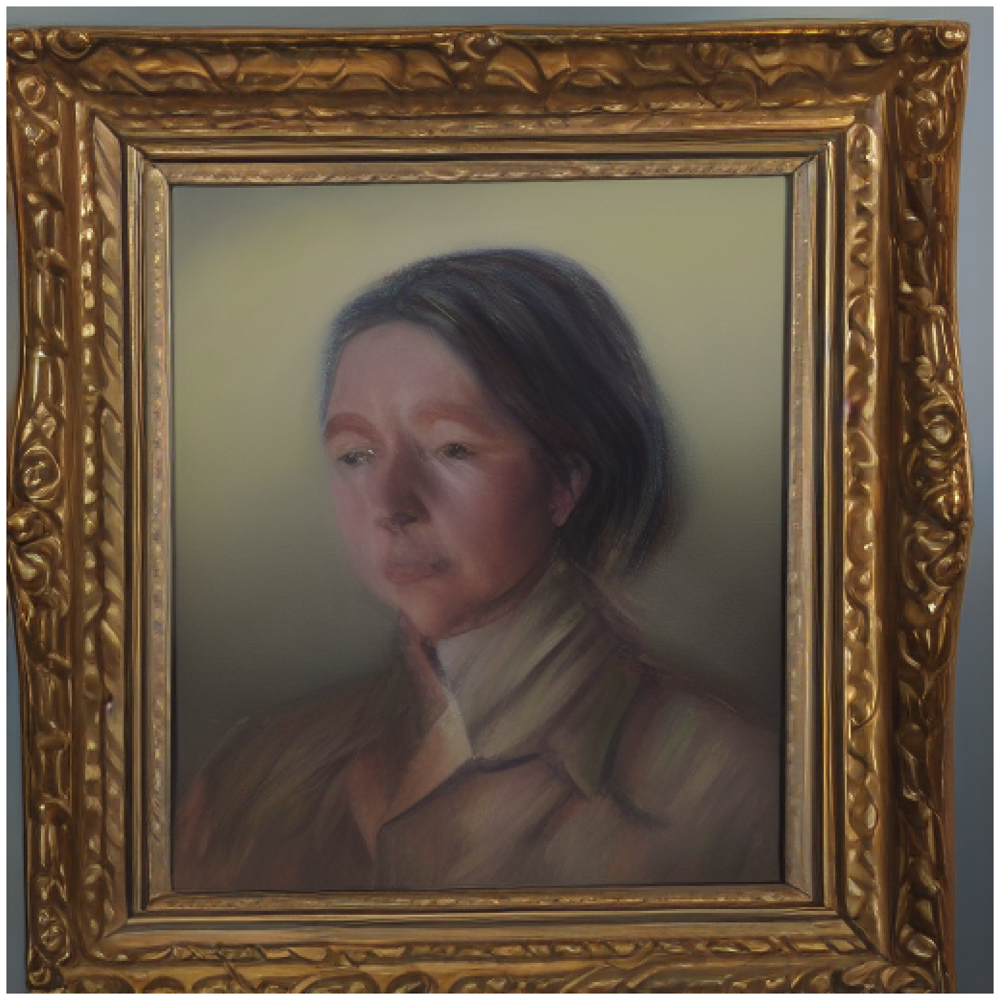

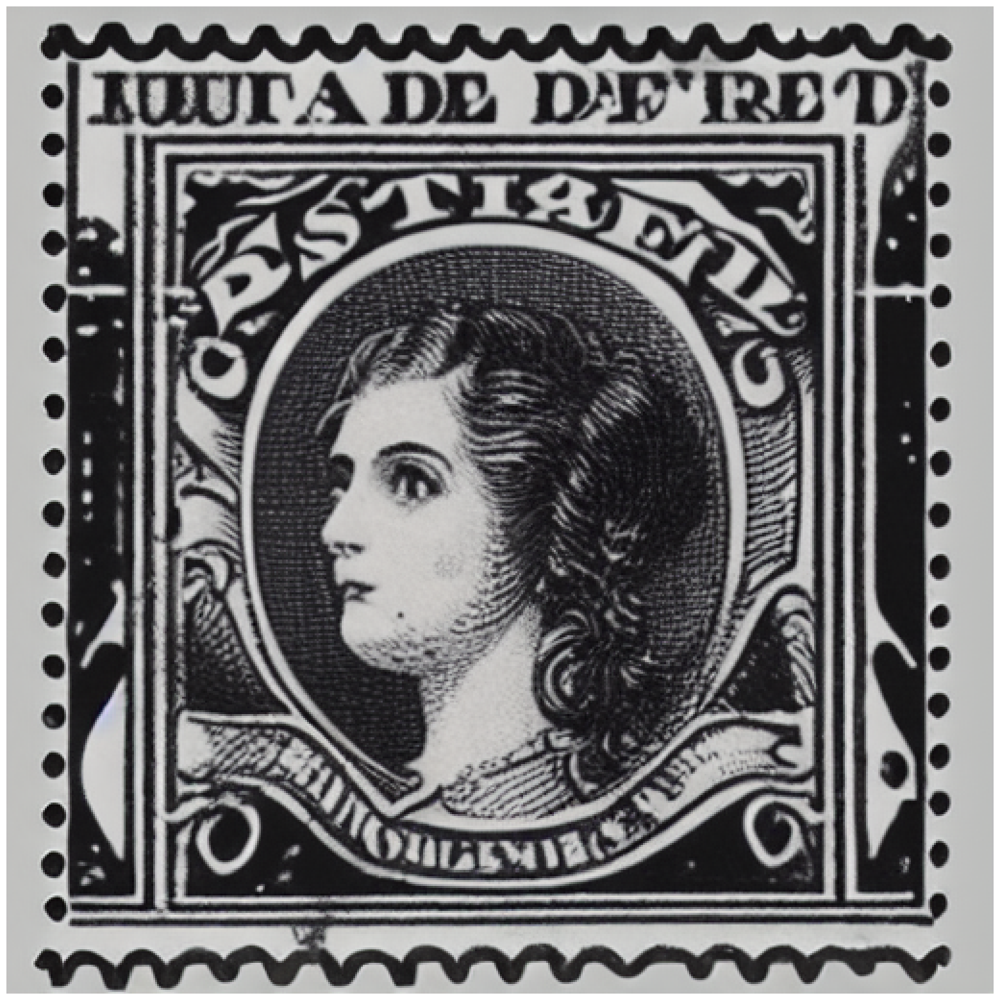

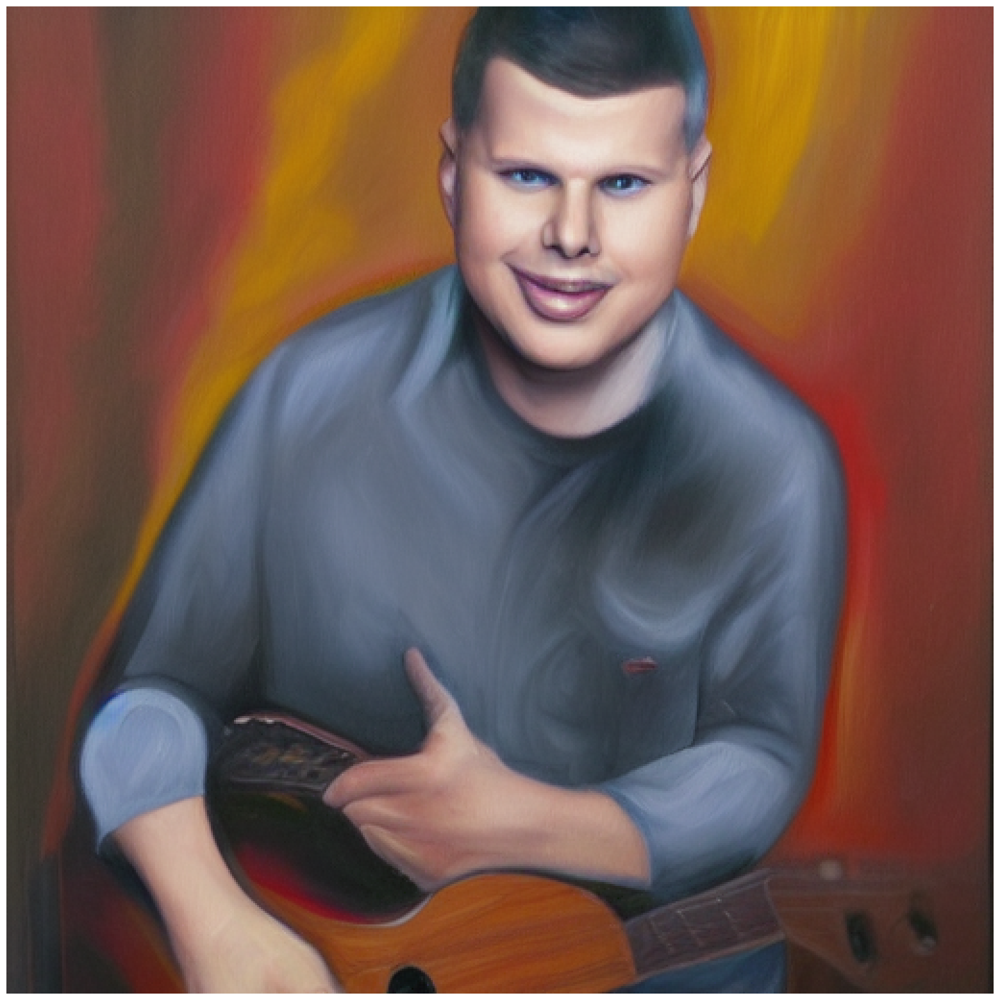

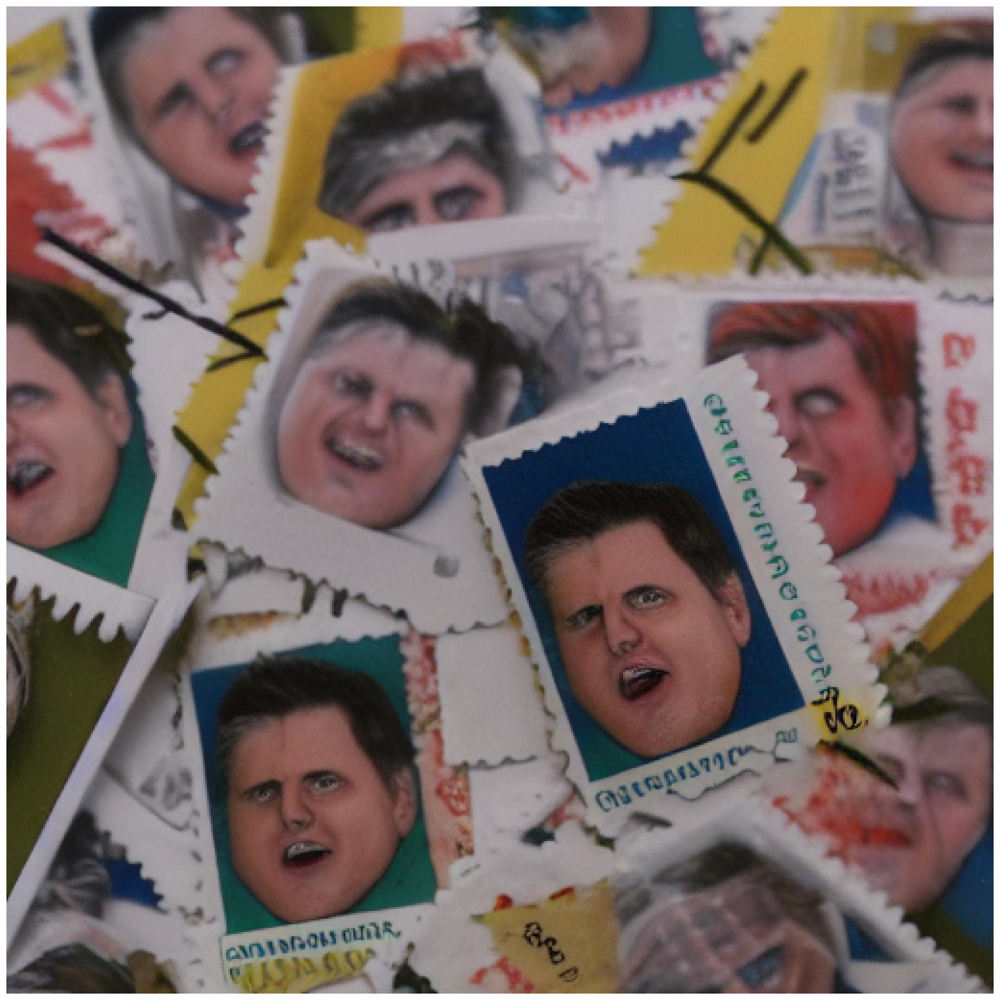

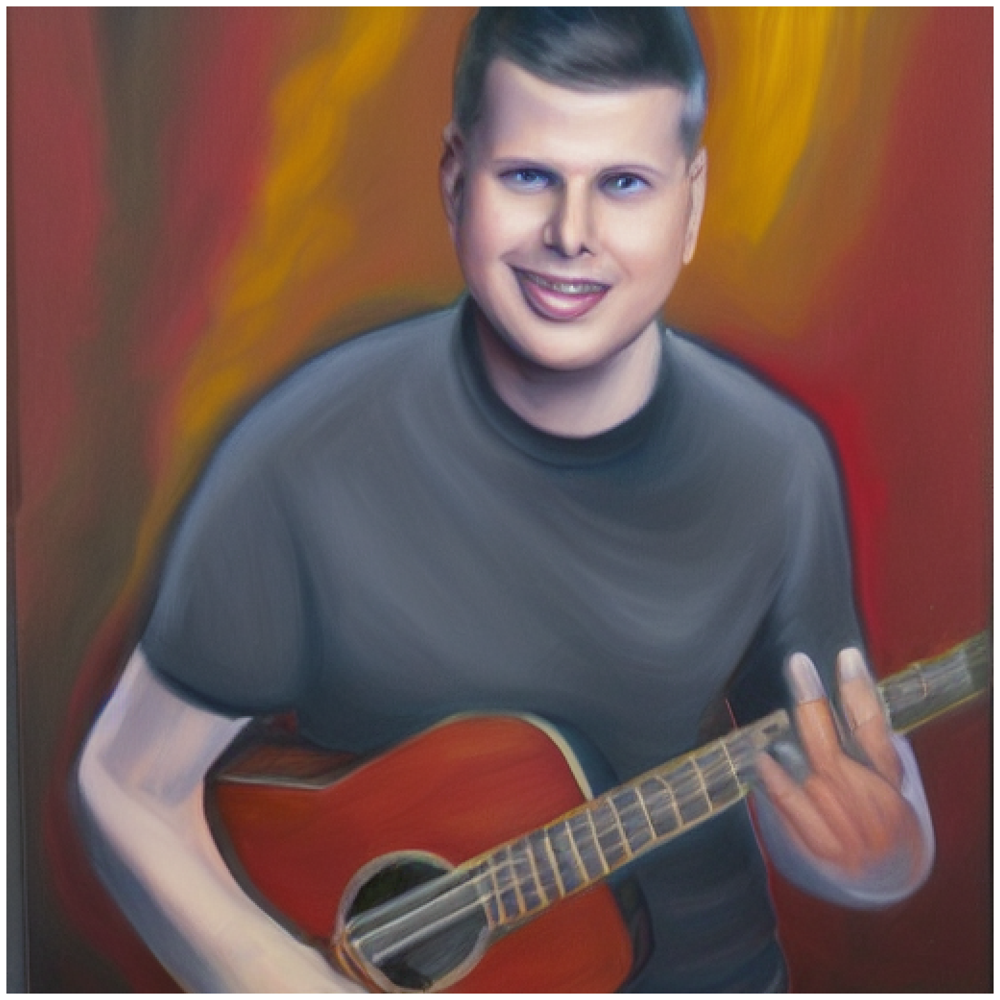

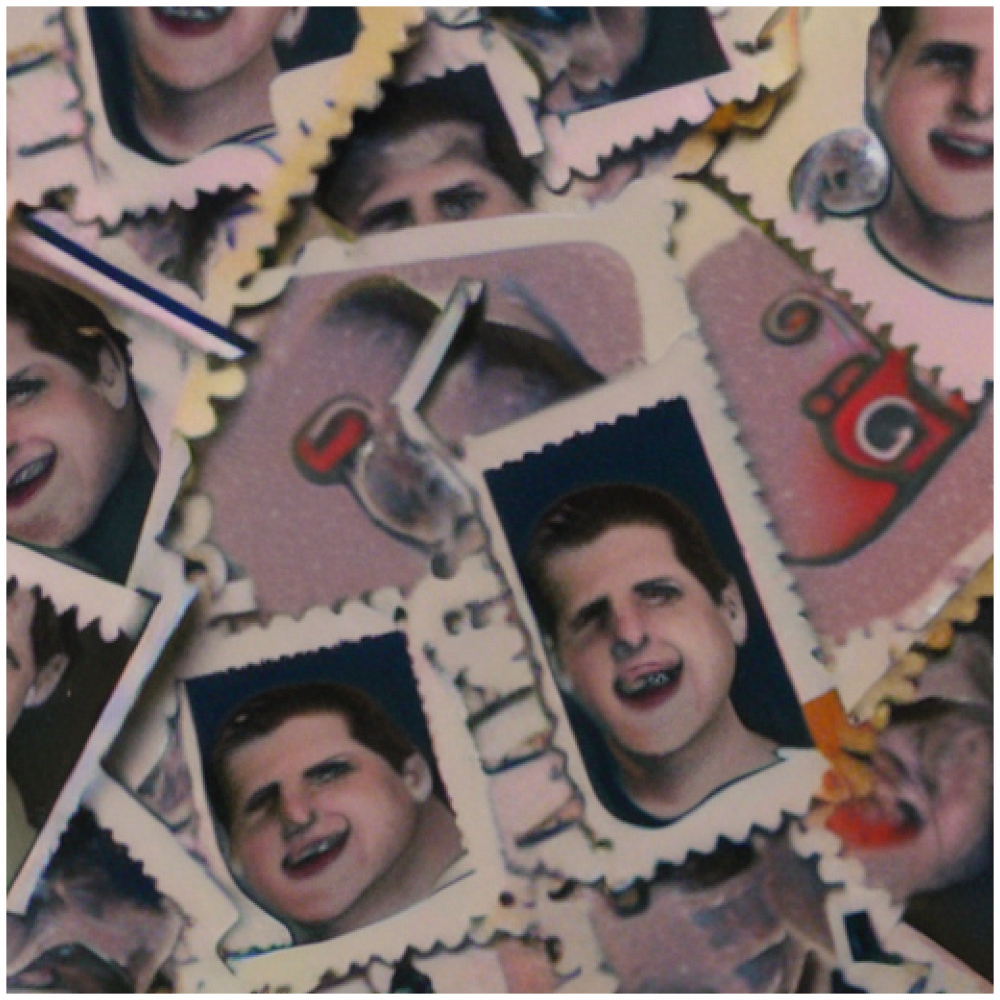

In [12]:
trainer.fit(
    train_ds,
    epochs=50,
    callbacks=cbs,
)

## Realizando inferência

Com o novo token adicionado e o embedding aprendido, podemos realizar a inferência e ver os resultados!

2023-09-25 00:22:27.802714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:22:27.827745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:22:27.889767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 15:55

2023-09-25 00:22:47.369265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:22:48.559292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:54 

2023-09-25 00:22:49.761292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:22:50.946432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:52

2023-09-25 00:22:52.143104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:22:53.337885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:49

2023-09-25 00:22:54.537691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:22:55.726908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:47

2023-09-25 00:22:56.927027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:22:58.120217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:45

2023-09-25 00:22:59.321997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:00.514949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:42

2023-09-25 00:23:01.718272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:02.912820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:40

2023-09-25 00:23:04.115418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:05.316467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:38

2023-09-25 00:23:06.523265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:07.717576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:35

2023-09-25 00:23:08.916549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:10.112695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:33

2023-09-25 00:23:11.314583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:12.520144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:31

2023-09-25 00:23:13.727272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:14.921856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:28

2023-09-25 00:23:16.126151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:17.329389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:26

2023-09-25 00:23:18.536697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:19.741258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:23

2023-09-25 00:23:20.949751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:22.149649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:21

2023-09-25 00:23:23.362155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:24.559005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:19

2023-09-25 00:23:25.763500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:26.969336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:16

2023-09-25 00:23:28.177598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:29.386823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:14

2023-09-25 00:23:30.597116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:31.798411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:12

2023-09-25 00:23:33.011253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:34.211452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:09

2023-09-25 00:23:35.415702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:36.625695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:07

2023-09-25 00:23:37.834164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:39.043805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:04

2023-09-25 00:23:40.248761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:41.439573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 1:02

2023-09-25 00:23:42.640582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:43.838507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 1:00

2023-09-25 00:23:45.049459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:46.243944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 57s 

2023-09-25 00:23:47.450469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:48.642467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 55s

2023-09-25 00:23:49.854080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:51.049398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 52s

2023-09-25 00:23:52.253599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:53.460585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 50s

2023-09-25 00:23:54.665892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:55.858551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 48s

2023-09-25 00:23:57.060951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:23:58.262646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 45s

2023-09-25 00:23:59.472036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:00.667652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 43s

2023-09-25 00:24:01.883497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:03.076933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 40s

2023-09-25 00:24:04.278875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:05.477376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 38s

2023-09-25 00:24:06.692485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:07.891070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 36s

2023-09-25 00:24:09.103585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:10.300977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 33s

2023-09-25 00:24:11.505697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:12.709908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 31s

2023-09-25 00:24:13.919106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:15.126701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 28s

2023-09-25 00:24:16.332031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:17.536076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 26s

2023-09-25 00:24:18.746177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:19.942345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 24s

2023-09-25 00:24:21.144567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:22.352036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 21s

2023-09-25 00:24:23.558435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:24.764513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 19s

2023-09-25 00:24:25.969187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:27.169318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 16s

2023-09-25 00:24:28.381317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:29.578667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 14s

2023-09-25 00:24:30.797087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:31.995265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 12s

2023-09-25 00:24:33.198450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:34.402993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 9s 

2023-09-25 00:24:35.612383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:36.820025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 7s

2023-09-25 00:24:38.026561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:39.236216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:24:40.444690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:41.650079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:24:42.861683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:24:44.068868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 137s 2s/step


2023-09-25 00:24:45.278265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


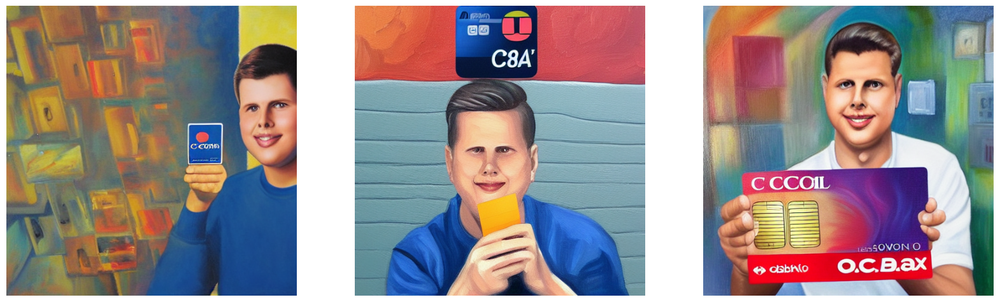

In [13]:
generated = trainer.stable_diffusion.text_to_image(
    f"an painting of {placeholder_token} holding a c6 bank Credit card ",
    batch_size=3,
    num_steps=50
)
plot_images(generated)

2023-09-25 00:25:16.860257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:25:16.877973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:25:16.930432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 1:58

2023-09-25 00:25:19.342464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:20.537499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:55

2023-09-25 00:25:21.739362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:22.945169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:53

2023-09-25 00:25:24.155176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:25.359159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:50

2023-09-25 00:25:26.565051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:27.771907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:48

2023-09-25 00:25:28.978463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:30.185034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:46

2023-09-25 00:25:31.388210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:32.583525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:43

2023-09-25 00:25:33.787142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:34.991516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:41

2023-09-25 00:25:36.197937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:37.402006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:38

2023-09-25 00:25:38.613369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:39.821125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:36

2023-09-25 00:25:41.031423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:42.234511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:34

2023-09-25 00:25:43.445584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:44.654015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:31

2023-09-25 00:25:45.867300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:47.074574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:29

2023-09-25 00:25:48.286251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:49.493441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:26

2023-09-25 00:25:50.699518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:51.905013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:24

2023-09-25 00:25:53.118402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:54.323592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:22

2023-09-25 00:25:55.534081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:56.740843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:19

2023-09-25 00:25:57.947236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:25:59.153557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:17

2023-09-25 00:26:00.360494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:01.567108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:14

2023-09-25 00:26:02.774330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:03.979475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:12

2023-09-25 00:26:05.187001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:06.394074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:09

2023-09-25 00:26:07.600524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:08.809581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:07

2023-09-25 00:26:10.013545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:11.221286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:05

2023-09-25 00:26:12.428569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:13.636918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 1:02

2023-09-25 00:26:14.844509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:16.051591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 1:00

2023-09-25 00:26:17.258994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:18.467345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 57s 

2023-09-25 00:26:19.670522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:20.861297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 55s

2023-09-25 00:26:22.058830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:23.240850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 53s

2023-09-25 00:26:24.430773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:25.603974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 50s

2023-09-25 00:26:26.786540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:27.954334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 48s

2023-09-25 00:26:29.128553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:30.289110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 45s

2023-09-25 00:26:31.464800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:32.619623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 43s

2023-09-25 00:26:33.777216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:34.929641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 40s

2023-09-25 00:26:36.087120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:37.235746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 38s

2023-09-25 00:26:38.387575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:39.527753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 35s

2023-09-25 00:26:40.669868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:41.812144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 33s

2023-09-25 00:26:42.957170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:44.095831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 31s

2023-09-25 00:26:45.239129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:46.371565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 28s

2023-09-25 00:26:47.511578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:48.646069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 26s

2023-09-25 00:26:49.786521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:50.915360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 23s

2023-09-25 00:26:52.053073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:53.184987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 21s

2023-09-25 00:26:54.318042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:55.446769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 18s

2023-09-25 00:26:56.588742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:57.715412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 16s

2023-09-25 00:26:58.843693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:26:59.967820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 14s

2023-09-25 00:27:01.099615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:02.214262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 11s

2023-09-25 00:27:03.338981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:04.464362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 9s 

2023-09-25 00:27:05.600090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:06.715008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 7s

2023-09-25 00:27:07.839791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:08.960263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:27:10.089182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:11.210608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:27:12.338473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:13.451087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 118s 2s/step


2023-09-25 00:27:14.568538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


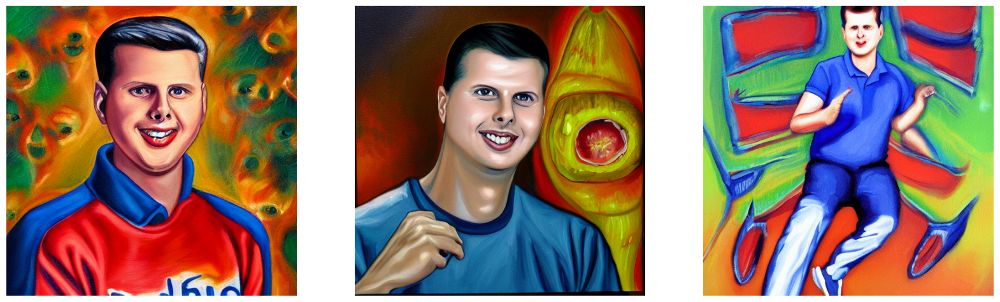

In [14]:
generated = trainer.stable_diffusion.text_to_image(
    f"an painting of {placeholder_token}",
    batch_size=3,
    num_steps=50
)
plot_images(generated)

2023-09-25 00:27:17.298112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:27:17.317598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:27:17.371578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 1:50

2023-09-25 00:27:19.613256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:20.726674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:47

2023-09-25 00:27:21.849064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:22.955117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:44

2023-09-25 00:27:24.077116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:25.188299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:42

2023-09-25 00:27:26.310401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:27.421206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:40

2023-09-25 00:27:28.541388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:29.650900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:38

2023-09-25 00:27:30.770182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:31.883697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:35

2023-09-25 00:27:33.006125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:34.111600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:33

2023-09-25 00:27:35.232922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:36.347778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:31

2023-09-25 00:27:37.467443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:38.577502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:29

2023-09-25 00:27:39.700682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:40.807175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:27

2023-09-25 00:27:41.927378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:43.038559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:24

2023-09-25 00:27:44.157647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:45.271644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:22

2023-09-25 00:27:46.390616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:47.501263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:20

2023-09-25 00:27:48.620611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:49.729304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:18

2023-09-25 00:27:50.853311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:51.963100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:15

2023-09-25 00:27:53.084809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:54.191354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:13

2023-09-25 00:27:55.315507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:56.429451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:11

2023-09-25 00:27:57.548511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:27:58.664703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:09

2023-09-25 00:27:59.790382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:00.896844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:06

2023-09-25 00:28:02.020122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:03.132494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:04

2023-09-25 00:28:04.255743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:05.369986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:02

2023-09-25 00:28:06.492198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:07.605999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:00

2023-09-25 00:28:08.729805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:09.841705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 58s 

2023-09-25 00:28:10.963843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:12.076354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 55s

2023-09-25 00:28:13.199079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:14.306164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 53s

2023-09-25 00:28:15.424874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:16.540796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 51s

2023-09-25 00:28:17.660494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:18.771622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 49s

2023-09-25 00:28:19.894985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:21.004181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 46s

2023-09-25 00:28:22.124789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:23.234703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 44s

2023-09-25 00:28:24.357973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:25.466208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 42s

2023-09-25 00:28:26.585363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:27.696406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 40s

2023-09-25 00:28:28.817618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:29.929110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 37s

2023-09-25 00:28:31.049262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:32.158153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 35s

2023-09-25 00:28:33.278589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:34.388603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 33s

2023-09-25 00:28:35.510665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:36.620983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 31s

2023-09-25 00:28:37.744027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:38.853182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 29s

2023-09-25 00:28:39.978559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:41.089029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 26s

2023-09-25 00:28:42.210513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:43.317724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 24s

2023-09-25 00:28:44.440275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:45.551921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 22s

2023-09-25 00:28:46.673389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:47.783586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 20s

2023-09-25 00:28:48.906960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:50.015212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 17s

2023-09-25 00:28:51.141002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:52.264401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 15s

2023-09-25 00:28:53.389842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:54.499979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 13s

2023-09-25 00:28:55.622536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:56.731432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 11s

2023-09-25 00:28:57.850703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:28:58.976610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 8s 

2023-09-25 00:29:00.101893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:01.213125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 6s

2023-09-25 00:29:02.334737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:03.446705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:29:04.566268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:05.680263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:29:06.808531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:07.932541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 112s 2s/step


2023-09-25 00:29:09.055327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


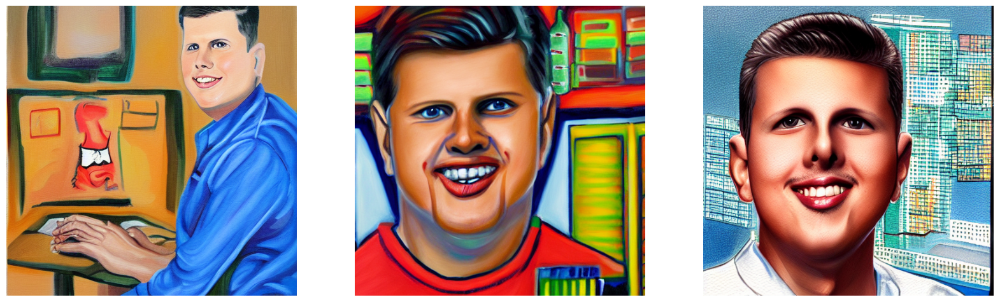

In [15]:
generated = trainer.stable_diffusion.text_to_image(
    f"an painting of {placeholder_token} as a CTO ",
    batch_size=3,
    num_steps=50
)
plot_images(generated)

2023-09-25 00:29:11.769684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:29:11.786285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:29:11.836479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 1:50

2023-09-25 00:29:14.068742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:15.178914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:47

2023-09-25 00:29:16.300588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:17.414244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:44

2023-09-25 00:29:18.537679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:19.649939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:42

2023-09-25 00:29:20.767401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:21.879427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:40

2023-09-25 00:29:23.005636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:24.124503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:38

2023-09-25 00:29:25.253550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:26.376928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:36

2023-09-25 00:29:27.505000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:28.625322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:34

2023-09-25 00:29:29.756759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:30.870895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:31

2023-09-25 00:29:31.996828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:33.119979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:29

2023-09-25 00:29:34.242797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:35.365402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:27

2023-09-25 00:29:36.494618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:37.620464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:25

2023-09-25 00:29:38.749035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:39.876837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:23

2023-09-25 00:29:41.017713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:42.145278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:20

2023-09-25 00:29:43.283497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:44.403703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:18

2023-09-25 00:29:45.538547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:46.659646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:16

2023-09-25 00:29:47.795560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:48.926866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:14

2023-09-25 00:29:50.066346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:51.195038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:12

2023-09-25 00:29:52.334059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:53.463516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:09

2023-09-25 00:29:54.602939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:55.731102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:07

2023-09-25 00:29:56.865904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:29:57.999430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:05

2023-09-25 00:29:59.142413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:00.274209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:03

2023-09-25 00:30:01.408716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:02.536092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:00

2023-09-25 00:30:03.678215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:04.808838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 58s 

2023-09-25 00:30:05.951277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:07.081685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 56s

2023-09-25 00:30:08.222209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:09.358043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 54s

2023-09-25 00:30:10.501317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:11.632241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 51s

2023-09-25 00:30:12.774070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:13.905442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 49s

2023-09-25 00:30:15.047485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:16.184289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 47s

2023-09-25 00:30:17.328369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:18.472173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 45s

2023-09-25 00:30:19.622858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:20.758911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 42s

2023-09-25 00:30:21.900768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:23.048159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 40s

2023-09-25 00:30:24.196908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:25.343826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 38s

2023-09-25 00:30:26.494183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:27.642803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 36s

2023-09-25 00:30:28.785895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:29.934938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 33s

2023-09-25 00:30:31.090155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:32.228306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 31s

2023-09-25 00:30:33.383978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:34.524482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 29s

2023-09-25 00:30:35.683334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:36.833607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 27s

2023-09-25 00:30:37.994256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:39.143676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 24s

2023-09-25 00:30:40.302976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:41.453442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 22s

2023-09-25 00:30:42.601194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:43.751718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 20s

2023-09-25 00:30:44.911766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:46.061904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 18s

2023-09-25 00:30:47.223398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:48.375767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 15s

2023-09-25 00:30:49.541955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:50.699321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 13s

2023-09-25 00:30:51.860886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:53.020403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 11s

2023-09-25 00:30:54.193367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:55.351900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 9s 

2023-09-25 00:30:56.522036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:30:57.687646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 6s

2023-09-25 00:30:58.853796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:31:00.021843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:31:01.190366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:31:02.354880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:31:03.523400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:31:04.690859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 114s 2s/step


2023-09-25 00:31:05.866292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


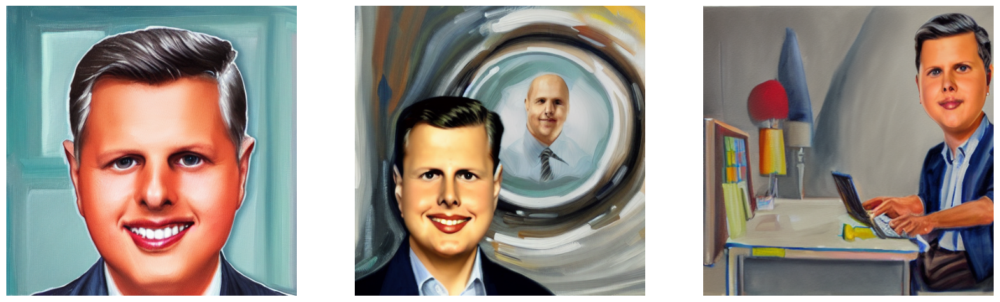

In [16]:
generated = trainer.stable_diffusion.text_to_image(
    f"an painting of {placeholder_token} as a executive of a technology company ",
    batch_size=3,
    num_steps=50
)
plot_images(generated)

2023-09-25 00:36:06.155088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:36:06.177230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:36:06.232615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 1:51

2023-09-25 00:36:08.485305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:09.589298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:46

2023-09-25 00:36:10.708329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:11.819386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:44

2023-09-25 00:36:12.941491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:14.053266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:42

2023-09-25 00:36:15.175476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:16.295738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:40

2023-09-25 00:36:17.418033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:18.528171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:38

2023-09-25 00:36:19.649304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:20.761315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:35

2023-09-25 00:36:21.878982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:22.996199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:33

2023-09-25 00:36:24.117034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:25.238271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:31

2023-09-25 00:36:26.364549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:27.492714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:29

2023-09-25 00:36:28.616925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:29.742777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:27

2023-09-25 00:36:30.869446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:31.998665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:25

2023-09-25 00:36:33.134735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:34.263621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:22

2023-09-25 00:36:35.395739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:36.523767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:20

2023-09-25 00:36:37.665693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:38.797226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:18

2023-09-25 00:36:39.936061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:41.068618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:16

2023-09-25 00:36:42.206954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:43.339177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:14

2023-09-25 00:36:44.472081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:45.608346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:12

2023-09-25 00:36:46.748610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:47.881323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:09

2023-09-25 00:36:49.023499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:50.157941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:07

2023-09-25 00:36:51.300735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:52.432770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:05

2023-09-25 00:36:53.575974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:54.710941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:03

2023-09-25 00:36:55.855477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:56.993935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:00

2023-09-25 00:36:58.141825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:36:59.278884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 58s 

2023-09-25 00:37:00.425998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:01.574740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 56s

2023-09-25 00:37:02.725557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:03.872635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 54s

2023-09-25 00:37:05.020628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:06.166632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 52s

2023-09-25 00:37:07.319073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:08.469852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 49s

2023-09-25 00:37:09.624626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:10.770024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 47s

2023-09-25 00:37:11.927344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:13.078250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 45s

2023-09-25 00:37:14.235276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:15.380512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 43s

2023-09-25 00:37:16.535551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:17.691215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 40s

2023-09-25 00:37:18.850475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:20.001463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 38s

2023-09-25 00:37:21.157054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:22.307666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 36s

2023-09-25 00:37:23.465246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:24.615545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 34s

2023-09-25 00:37:25.776154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:26.925961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 31s

2023-09-25 00:37:28.091188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:29.243686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 29s

2023-09-25 00:37:30.404832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:31.559040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 27s

2023-09-25 00:37:32.720375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:33.878050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 25s

2023-09-25 00:37:35.048922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:36.205507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 22s

2023-09-25 00:37:37.363525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:38.521060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 20s

2023-09-25 00:37:39.687763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:40.848635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 18s

2023-09-25 00:37:42.013490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:43.177402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 15s

2023-09-25 00:37:44.345357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:45.506037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 13s

2023-09-25 00:37:46.675607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:47.837863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 11s

2023-09-25 00:37:49.003014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:50.166878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 9s 

2023-09-25 00:37:51.338949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:52.501609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 6s

2023-09-25 00:37:53.666044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:54.834038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:37:56.000867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:57.169481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:37:58.339270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:37:59.509964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 114s 2s/step


2023-09-25 00:38:00.684930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


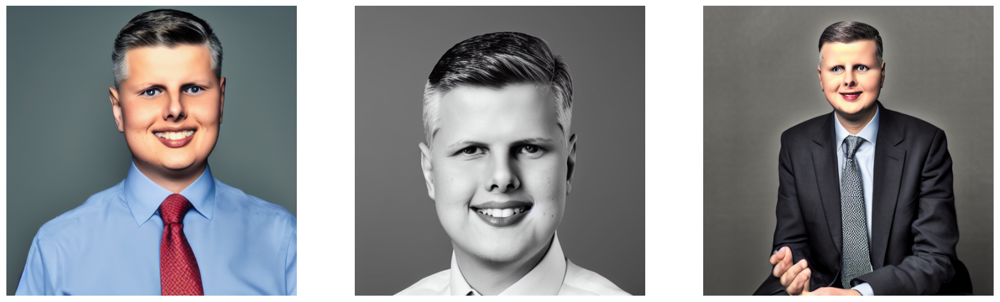

In [17]:
generated = trainer.stable_diffusion.text_to_image(
    f" a photo of {placeholder_token} as a executive of a technology company ",
    batch_size=3,
    num_steps=50
)
plot_images(generated)

2023-09-25 00:38:03.364852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:38:03.384298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:38:03.433081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 1:54

2023-09-25 00:38:05.766295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:06.933682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:52

2023-09-25 00:38:08.100298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:09.271203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:49

2023-09-25 00:38:10.438521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:11.606652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:47

2023-09-25 00:38:12.774421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:13.944466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:45

2023-09-25 00:38:15.124814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:16.299768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:43

2023-09-25 00:38:17.482517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:18.654316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:40

2023-09-25 00:38:19.834252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:21.007897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:38

2023-09-25 00:38:22.191029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:23.363366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:36

2023-09-25 00:38:24.549058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:25.719377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:33

2023-09-25 00:38:26.904435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:28.073638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:31

2023-09-25 00:38:29.256351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:30.430383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:29

2023-09-25 00:38:31.611205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:32.780811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:26

2023-09-25 00:38:33.966555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:35.135201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:24

2023-09-25 00:38:36.318207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:37.490637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:22

2023-09-25 00:38:38.673643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:39.844454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:19

2023-09-25 00:38:41.026785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:42.196937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:17

2023-09-25 00:38:43.381381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:44.552641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:15

2023-09-25 00:38:45.736194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:46.908574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:12

2023-09-25 00:38:48.090206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:49.263353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:10

2023-09-25 00:38:50.443472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:51.618482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:08

2023-09-25 00:38:52.799188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:53.984581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:05

2023-09-25 00:38:55.168453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:56.342221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:03

2023-09-25 00:38:57.532369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:38:58.716287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 1:01

2023-09-25 00:38:59.903127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:01.090782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 58s 

2023-09-25 00:39:02.276694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:03.464122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 56s

2023-09-25 00:39:04.649721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:05.839347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 54s

2023-09-25 00:39:07.023318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:08.210402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 51s

2023-09-25 00:39:09.403501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:10.591957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 49s

2023-09-25 00:39:11.787172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:12.974385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 47s

2023-09-25 00:39:14.172906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:15.358421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 44s

2023-09-25 00:39:16.551354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:17.732293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 42s

2023-09-25 00:39:18.925920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:20.106940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 40s

2023-09-25 00:39:21.305516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:22.493624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 37s

2023-09-25 00:39:23.691486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:24.882077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 35s

2023-09-25 00:39:26.084041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:27.277370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 33s

2023-09-25 00:39:28.477137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:29.671992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 30s

2023-09-25 00:39:30.871029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:32.063488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 28s

2023-09-25 00:39:33.264077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:34.457123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 26s

2023-09-25 00:39:35.653082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:36.847731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 23s

2023-09-25 00:39:38.045898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:39.237645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 21s

2023-09-25 00:39:40.439384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:41.635295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 18s

2023-09-25 00:39:42.834787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:44.039878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 16s

2023-09-25 00:39:45.243575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:46.437029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 14s

2023-09-25 00:39:47.638196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:48.829694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 11s

2023-09-25 00:39:50.033141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:51.239775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 9s 

2023-09-25 00:39:52.443769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:53.640189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 7s

2023-09-25 00:39:54.842447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:56.045301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:39:57.256780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:39:58.452677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:39:59.659377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:00.859816: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 119s 2s/step


2023-09-25 00:40:02.062764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


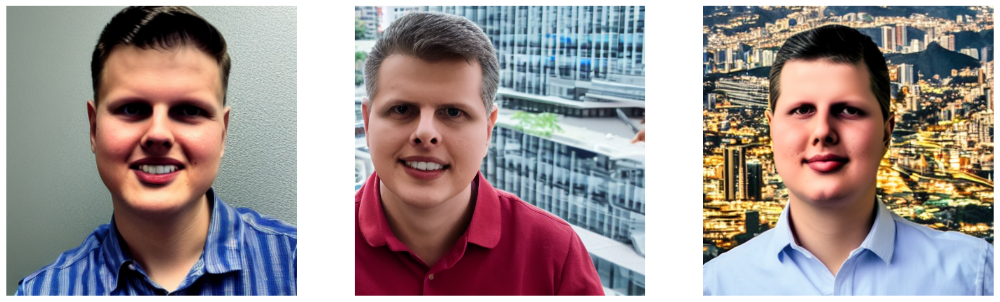

In [18]:
generated = trainer.stable_diffusion.text_to_image(
    f" a photo of {placeholder_token} who is the CTO of a technology company in Brazil",
    batch_size=3,
    num_steps=50
)
plot_images(generated)

2023-09-25 00:40:04.831845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:40:04.850808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [1,77]
	 [[{{node Placeholder/_1}}]]
2023-09-25 00:40:04.901500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,76

 1/50 [..............................] - ETA: 1:58

2023-09-25 00:40:07.312132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:08.503888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 2/50 [>.............................] - ETA: 1:55

2023-09-25 00:40:09.709266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:10.901946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 3/50 [>.............................] - ETA: 1:52

2023-09-25 00:40:12.101677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:13.305563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 4/50 [=>............................] - ETA: 1:50

2023-09-25 00:40:14.511852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:15.703666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 5/50 [==>...........................] - ETA: 1:47

2023-09-25 00:40:16.909386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:18.102077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 6/50 [==>...........................] - ETA: 1:45

2023-09-25 00:40:19.305788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:20.513040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 7/50 [===>..........................] - ETA: 1:43

2023-09-25 00:40:21.722367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:22.926358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 8/50 [===>..........................] - ETA: 1:40

2023-09-25 00:40:24.134993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:25.332168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


 9/50 [====>.........................] - ETA: 1:38

2023-09-25 00:40:26.535633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:27.732503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


10/50 [=====>........................] - ETA: 1:36

2023-09-25 00:40:28.950347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:30.149558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


11/50 [=====>........................] - ETA: 1:33

2023-09-25 00:40:31.363900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:32.562925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


12/50 [======>.......................] - ETA: 1:31

2023-09-25 00:40:33.765043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:34.972397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


13/50 [======>.......................] - ETA: 1:29

2023-09-25 00:40:36.180424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:37.388323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


14/50 [=======>......................] - ETA: 1:26

2023-09-25 00:40:38.594474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:39.799804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


15/50 [========>.....................] - ETA: 1:24

2023-09-25 00:40:41.008037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:42.217850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


16/50 [========>.....................] - ETA: 1:21

2023-09-25 00:40:43.427417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:44.616745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


17/50 [=========>....................] - ETA: 1:19

2023-09-25 00:40:45.817251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:47.014130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


18/50 [=========>....................] - ETA: 1:17

2023-09-25 00:40:48.226613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:49.422794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


19/50 [==========>...................] - ETA: 1:14

2023-09-25 00:40:50.626268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:51.819898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


20/50 [===========>..................] - ETA: 1:12

2023-09-25 00:40:53.018740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:54.224954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


21/50 [===========>..................] - ETA: 1:09

2023-09-25 00:40:55.432762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:56.628141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


22/50 [============>.................] - ETA: 1:07

2023-09-25 00:40:57.839485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:40:59.035668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


23/50 [============>.................] - ETA: 1:04

2023-09-25 00:41:00.241698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:01.445981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


24/50 [=============>................] - ETA: 1:02

2023-09-25 00:41:02.652687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:03.859570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


25/50 [==============>...............] - ETA: 1:00

2023-09-25 00:41:05.065388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:06.269389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


26/50 [==============>...............] - ETA: 57s 

2023-09-25 00:41:07.480481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:08.685454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


27/50 [===============>..............] - ETA: 55s

2023-09-25 00:41:09.892351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:11.096852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


28/50 [===============>..............] - ETA: 52s

2023-09-25 00:41:12.307609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:13.513986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


29/50 [================>.............] - ETA: 50s

2023-09-25 00:41:14.720714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:15.929014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


30/50 [=================>............] - ETA: 48s

2023-09-25 00:41:17.137705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:18.342412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


31/50 [=================>............] - ETA: 45s

2023-09-25 00:41:19.548528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:20.755741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


32/50 [==================>...........] - ETA: 43s

2023-09-25 00:41:21.965337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:23.172416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


33/50 [==================>...........] - ETA: 40s

2023-09-25 00:41:24.382507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:25.591511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


34/50 [===================>..........] - ETA: 38s

2023-09-25 00:41:26.798233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:28.004595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


35/50 [====================>.........] - ETA: 36s

2023-09-25 00:41:29.214957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:30.422126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


36/50 [====================>.........] - ETA: 33s

2023-09-25 00:41:31.634990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:32.846605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


37/50 [=====================>........] - ETA: 31s

2023-09-25 00:41:34.055804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:35.264231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


38/50 [=====================>........] - ETA: 28s

2023-09-25 00:41:36.473598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:37.683544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


39/50 [======================>.......] - ETA: 26s

2023-09-25 00:41:38.890324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:40.100753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


40/50 [=======================>......] - ETA: 24s

2023-09-25 00:41:41.322658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:42.534528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


41/50 [=======================>......] - ETA: 21s

2023-09-25 00:41:43.738947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:44.947004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


42/50 [========================>.....] - ETA: 19s

2023-09-25 00:41:46.156769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:47.366634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


43/50 [========================>.....] - ETA: 16s

2023-09-25 00:41:48.582358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:49.786637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


44/50 [=========================>....] - ETA: 14s

2023-09-25 00:41:51.003185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:52.211677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


45/50 [==========================>...] - ETA: 12s

2023-09-25 00:41:53.419690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:54.628743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


46/50 [==========================>...] - ETA: 9s 

2023-09-25 00:41:55.849238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:57.056337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


47/50 [===========================>..] - ETA: 7s

2023-09-25 00:41:58.268565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:41:59.477183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


48/50 [===========================>..] - ETA: 4s

2023-09-25 00:42:00.695544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:42:01.906483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


49/50 [============================>.] - ETA: 2s

2023-09-25 00:42:03.123514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]
2023-09-25 00:42:04.330807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_2' with dtype float and shape [3,77,768]
	 [[{{node Placeholder/_2}}]]


50/50 [==============================] - 121s 2s/step


2023-09-25 00:42:05.541208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [3,64,64,4]
	 [[{{node Placeholder/_0}}]]


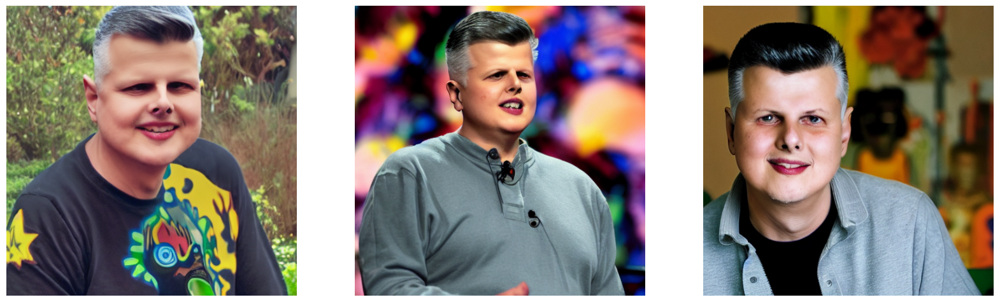

In [19]:
generated = trainer.stable_diffusion.text_to_image(
    f" a photo of {placeholder_token}  ",
    batch_size=3,
    num_steps=50
)
plot_images(generated)